In [ ]:
# Mount to Google Drive to access data set
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


> AHA survey data from year *1996* to *2020* derived via *.csv* files





In [ ]:
# Connect to correct folder for data sets
%cd "/content/gdrive/My Drive/UNCW-AICourses/ProjectFoldersSpring2022/Team1-DrWilliamOpoku-Agyeman/data/"
!ls

/content/gdrive/.shortcut-targets-by-id/13tLHmshjZ1Or4ScgyMMhYwtwheatVbTG/UNCW-AICourses/ProjectFoldersSpring2022/Team1-DrWilliamOpoku-Agyeman/data
 aha_2000.csv	     aha_2020.csv	       AS2018appendices.xlsx
 aha_2001.csv	     aha_96.csv		       cms_2019.csv
 aha_2002.csv	     aha_97.csv		       dfsum2020.csv
 aha_2003.csv	     aha_98.csv		       r_functions.docx
 aha_2004.csv	     aha_99.csv		      'Variables_of Interest .xlsx'
 aha_2005-2018.csv  'aha_variables (1).xlsx'
 aha_2019.csv	     aha_variables.xlsx




> Installation of python packages required for the data processing

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
#from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB

from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
from sklearn.metrics import confusion_matrix,classification_report

In [ ]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from zlib import crc32
import hashlib
import warnings
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from pandas.plotting import scatter_matrix
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import FeatureUnion
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from scipy import stats
import joblib
from scipy.stats import geom, expon
from scipy.stats import expon, reciprocal
from sklearn.tree import ExtraTreeRegressor, DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor

> Extract data from csv files to Dataframe using pandas

In [ ]:
data1 = pd.read_csv("aha_2005-2018.csv", header=0, index_col=0, low_memory=False, encoding = "ISO-8859-1")
data1.columns = map(str.upper, data1.columns)
data2 = pd.read_csv("aha_2019.csv", header=0)
data2.columns = map(str.upper, data2.columns)



In [ ]:
data2.drop('ROW', axis=1)

,ID,REG,STCD,HOSPN,DTBEG,DBEGM,DBEGD,DTEND,DENDM,DENDD,...,FTECRAD,FTECLAB,FTECPH,FTECPHT,FTECRESP,TEOB,TCOB,TGOB,NEOB,TPOB
0,6030010,0,3,10.0,NaN,NaN,NaN,NaN,NaN,NaN,...,16,11,12,11,1,NaN,NaN,NaN,NaN,NaN
1,6040001,0,4,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,19,14,7,7,13,NaN,NaN,NaN,NaN,NaN
2,6040002,0,4,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,18,13,7,6,13,NaN,NaN,NaN,NaN,NaN
3,6040004,0,4,4.0,NaN,NaN,NaN,NaN,NaN,NaN,...,47,37,21,21,34,NaN,NaN,NaN,NaN,NaN
4,6040005,0,4,5.0,1/1/2019,1.0,1.0,12/31/2019,12.0,31.0,...,32,21,11,10,16,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6157,6950410,9,95,410.0,10/1/2018,10.0,1.0,9/30/2019,9.0,30.0,...,101,190,57,59,43,18.0,0.0,0.0,0.0,18.0
6158,6950420,9,95,420.0,NaN,NaN,NaN,NaN,NaN,NaN,...,7,6,1,2,3,NaN,NaN,NaN,NaN,NaN
6159,6950425,9,95,425.0,1/1/2019,1.0,1.0,12/31/2019,12.0,31.0,...,12,12,13,16,19,0.0,0.0,0.0,7.0,7.0
6160,6950430,9,95,430.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0,1,3,2,1,NaN,NaN,NaN,NaN,NaN


In [ ]:
data2['BSC']

0       1
1       4
2       4
3       7
4       4
       ..
6157    4
6158    1
6159    4
6160    4
6161    4
Name: BSC, Length: 6162, dtype: int64

In [ ]:
desc = pd.read_excel("aha_variables.xlsx", header=0)
desc.head()

,variable,type,label,nulls,Unnamed: 4,Unnamed: 5
0,ID,character,AHA Identification Number,0,NaN,NaN
1,REG,numeric,AHA Region Code,0,NaN,NaN
2,STCD,numeric,AHA State Code,0,NaN,NaN
3,HOSPN,numeric,AHA Hospital Number,13,NaN,NaN
4,DTBEG,Date,Beginning of reporting period,1992,NaN,NaN


In [ ]:
desc[desc['variable']=='CBSATYPE']

,variable,type,label,nulls,Unnamed: 4,Unnamed: 5
872,CBSATYPE,character,CBSA Type,0,NaN,NaN


# Exploratory Data Analysis


> Number of beds available in rural, micro and metro divisions

> Bed Size Code - BSC - gives number of beds


    Code	     Description

    1		    6-24 beds

    2		    25-49 beds

    3		    50-99 beds

    4		    100-199 beds

    5            200-299 beds

    6		    300-399 beds

    7		    400-499 beds

    8		    500 or more beds



[Text(0, 0, '6-24 beds'),
 Text(1, 0, '25-49 beds'),
 Text(2, 0, '50-99 beds'),
 Text(3, 0, '100-199 beds'),
 Text(4, 0, '200-299 beds'),
 Text(5, 0, '300-399 beds'),
 Text(6, 0, '400-499 beds'),
 Text(7, 0, '500 or more beds')]

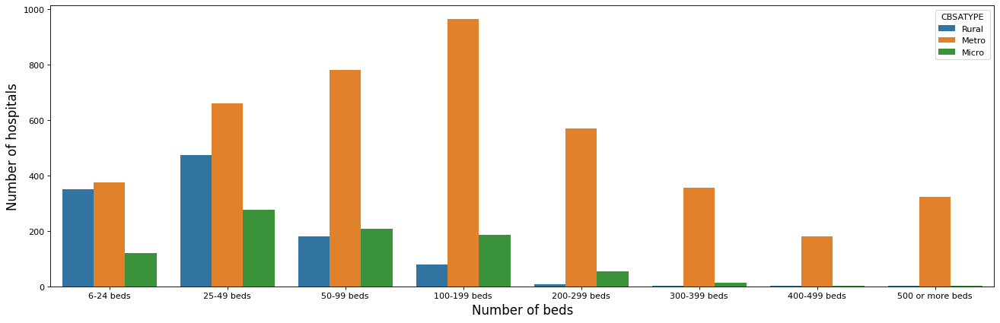

In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(20, 6), dpi=80)
g = sns.countplot(x = data2['BSC'], hue = data2['CBSATYPE'])
g.set_xlabel("Number of beds", fontsize=15)
g.set_ylabel("Number of hospitals", fontsize=15)
g.set_xticklabels(["6-24 beds","25-49 beds","50-99 beds","100-199 beds","200-299 beds","300-399 beds","400-499 beds","500 or more beds"])

In [ ]:
dt = data1
dt.loc[dt.CBSATYPE == 'Division','CBSATYPE'] = 'Rural'
dt.CBSATYPE.value_counts()
dt = dt.groupby(['YEAR','CBSATYPE'])
dt = dt.ID.nunique().reset_index()



> Number of Community Hospitals, 2005 – 2018





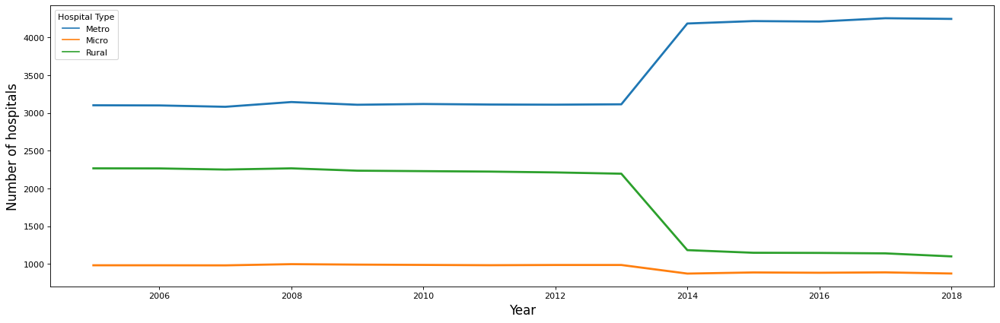

In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(20, 6), dpi=80)
g = sns.lineplot(data=dt,x='YEAR', y='ID', hue='CBSATYPE', linewidth=2.5)
g.set_xlabel("Year", fontsize=15)
g.set_ylabel("Number of hospitals", fontsize=15);
g.legend(title="Hospital Type")

In [ ]:
dt = data1
dt.CNTRL.count()
dt = dt.loc[dt.CNTRL <= 23]
dt = dt.groupby(['YEAR']).agg({'ADMTOT':'sum'})
dt.ADMTOT /= 1000000
dt

,ADMTOT
YEAR,
2005,31.512237
2006,31.566238
2007,31.667753
2008,31.864478
2009,31.582366
2010,31.126833
2011,30.625542
2012,29.999350
2013,29.457456



> Total Admissions per Year, 2005 – 2018 in community hospitals



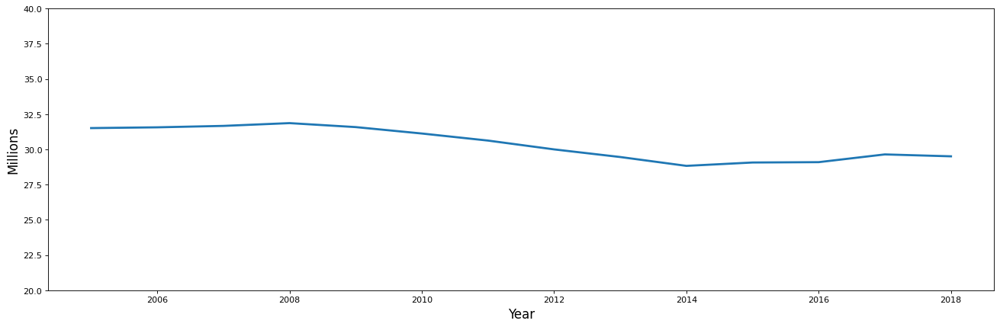

In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(20, 6), dpi=80)
g = sns.lineplot(data=dt,x='YEAR', y='ADMTOT', linewidth=2.5)
g.set_xlabel("Year", fontsize=15)
g.set_ylabel("Millions", fontsize=15);
g.set_ylim((20,40));



> Number of hospitals per state



In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(20, 6), dpi=80)
g = sns.countplot(data2['MSTATE'])
g.set_ylabel("Number of hospitals", fontsize=15)
g.set_xlabel("State", fontsize=15)

ValueError: ignored

<Figure size 1600x480 with 0 Axes>


> Hospitals sponsored by Government, Nonfederal funded authorities
*   12		State
*   13		County
*   14		City
*   15		City-county
*   16		Hospital district or authority







In [ ]:
#convert CNTRL to str
data1['CNTRL'] = data1['CNTRL'].astype(str)
df_govt = data1[data1['CNTRL'].isin(['12','13','14','15','16'])]
from matplotlib.pyplot import figure
figure(figsize=(15, 6), dpi=80)
g = sns.countplot(df_govt['CNTRL'])
g.set_xticklabels(['State','City','Hospital district or authority','City-county','County'])
g.set_xlabel("Government, Nonfederal funded", fontsize=15)
g.set_ylabel("Number of Hospitals", fontsize=15)

KeyError: ignored

<Figure size 1200x480 with 0 Axes>


> Hospitals sponsored by Government, federal funded authorities
* 40		Department of Defense
* 44		Public Health Service other than(Non-Indian)
* 45		Veterans Affairs
* 46		Federal other than 41-45, 47-48
* 47		Public Health Service Indian Service
* 48		Department of Justice


Text(0, 0.5, 'Number of Hospitals')

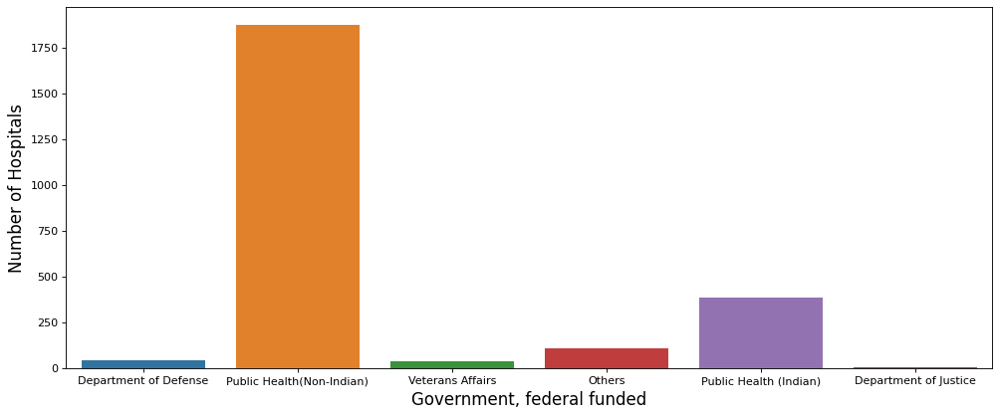

In [ ]:
data1['CNTRL'] = data1['CNTRL'].astype(str)
df_govt_fed = data1[data1['CNTRL'].isin(['40','44','45','46','47','48'])]
from matplotlib.pyplot import figure
figure(figsize=(15, 6), dpi=80)
g = sns.countplot(df_govt_fed['CNTRL'])
g.set_xticklabels(['Department of Defense','Public Health(Non-Indian)','Veterans Affairs','Others','Public Health (Indian)','Department of Justice'])
g.set_xlabel("Government, federal funded", fontsize=15)
g.set_ylabel("Number of Hospitals", fontsize=15)



> Hospitals sponsored by Nongovernment, not-for-profit authorities
* 21		Church operated
* 23		Other not-for-profit


Text(0, 0.5, 'Number of Hospitals')

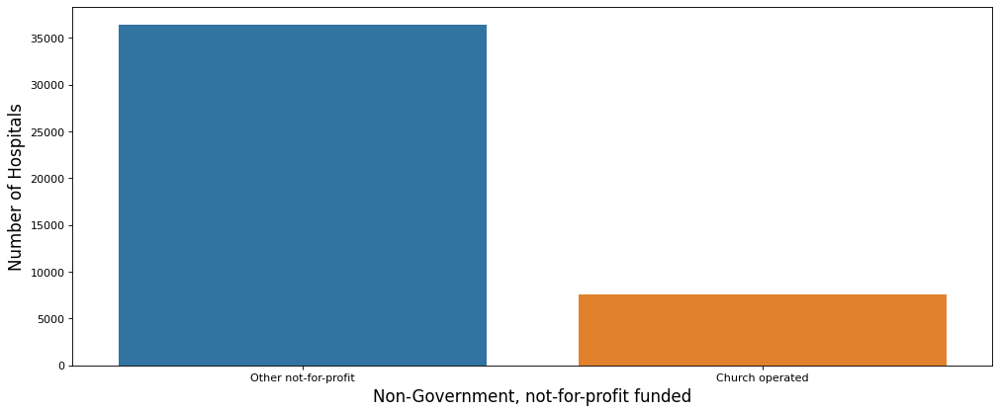

In [ ]:
#convert CNTRL to str
data1['CNTRL'] = data1['CNTRL'].astype(str)
df_non_govt = data1[data1['CNTRL'].isin(['21','23'])]
from matplotlib.pyplot import figure
figure(figsize=(15, 6), dpi=80)
g = sns.countplot(df_non_govt['CNTRL'])
g.set_xticklabels(['Other not-for-profit','Church operated'])
g.set_xlabel("Non-Government, not-for-profit funded", fontsize=15)
g.set_ylabel("Number of Hospitals", fontsize=15)

> Hospitals sponsored by Investor-owned (for-profit) authorities
* 31		Individual
* 32		Partnership
* 33		Corporation

Text(0, 0.5, 'Number of Hospitals')

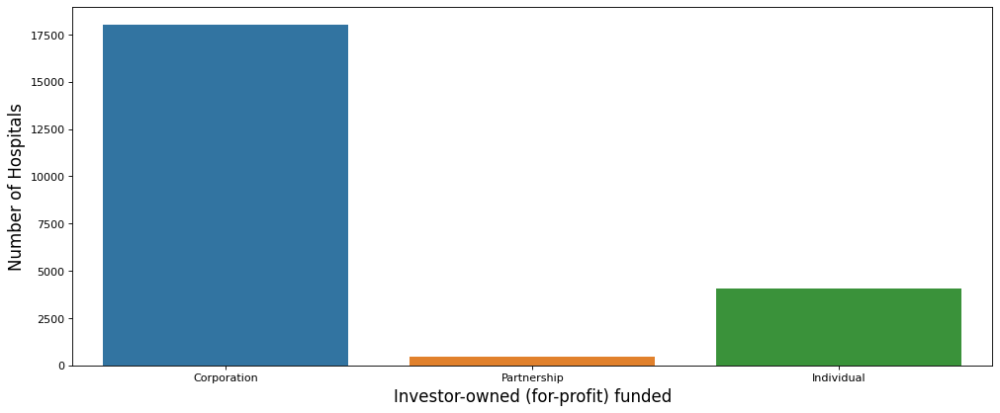

In [ ]:
data1['CNTRL'] = data1['CNTRL'].astype(str)
df_profit = data1[data1['CNTRL'].isin(['31','32','33'])]
from matplotlib.pyplot import figure
figure(figsize=(15, 6), dpi=80)
g = sns.countplot(df_profit['CNTRL'])
g.set_xticklabels(['Corporation','Partnership','Individual'])
g.set_xlabel("Investor-owned (for-profit) funded", fontsize=15)
g.set_ylabel("Number of Hospitals", fontsize=15)



> Number of Operating Rooms VS Number of Surgeries



Text(0, 0.5, 'Number of Surgeries')

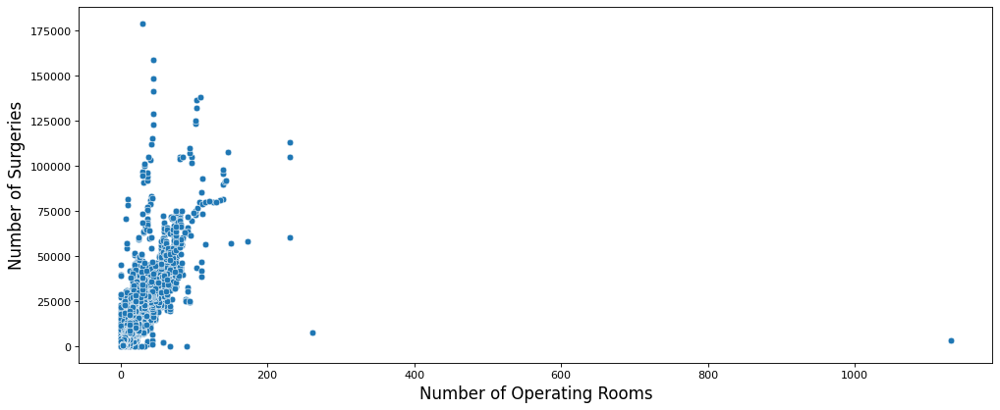

In [ ]:
# from matplotlib.pyplot import figure
# figure(figsize=(15, 6), dpi=80)
# g = sns.scatterplot(y='SUROPTOT', x='OPRA', data=data1)
# g.set_xlabel("Number of Operating Rooms", fontsize=15)
# g.set_ylabel("Number of Surgeries", fontsize=15)



> Average number of hospital visits vs number of admissions made
* 1		6-24 beds
* 2		25-49 beds
* 3		50-99 beds
* 4		100-199 beds
* 5		200-299 beds
* 6		300-399 beds
* 7		400-499 beds
* 8		500 or more beds





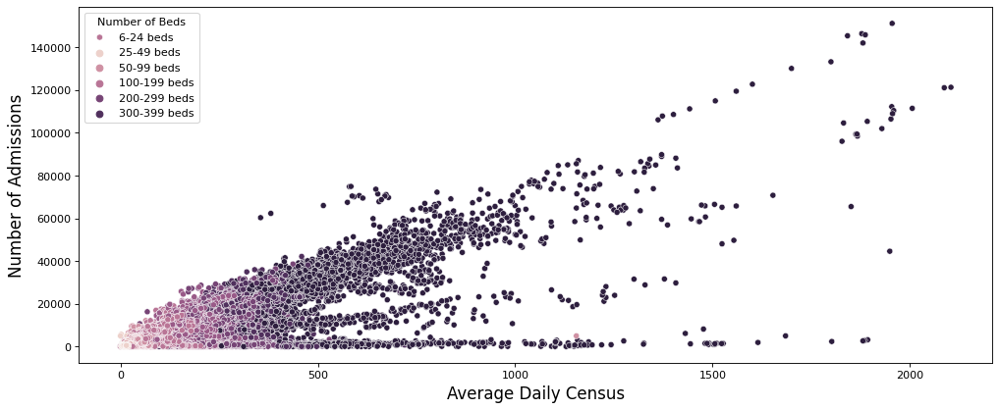

In [ ]:
#ADC - Average Daily Census
#ADMTOT - Admissions, (As Hosp)
from matplotlib.pyplot import figure
figure(figsize=(15, 6), dpi=80)
g = sns.scatterplot(y='ADMTOT', x='ADC', s=30, color=".15", hue='BSC', data=data1)
g.set_xlabel("Average Daily Census", fontsize=15)
g.set_ylabel("Number of Admissions", fontsize=15)
plt.legend(labels=["6-24 beds","25-49 beds","50-99 beds","100-199 beds","200-299 beds","300-399 beds","400-499 beds","500 or more beds"], title = "Number of Beds")




> Correlation between variables in the data


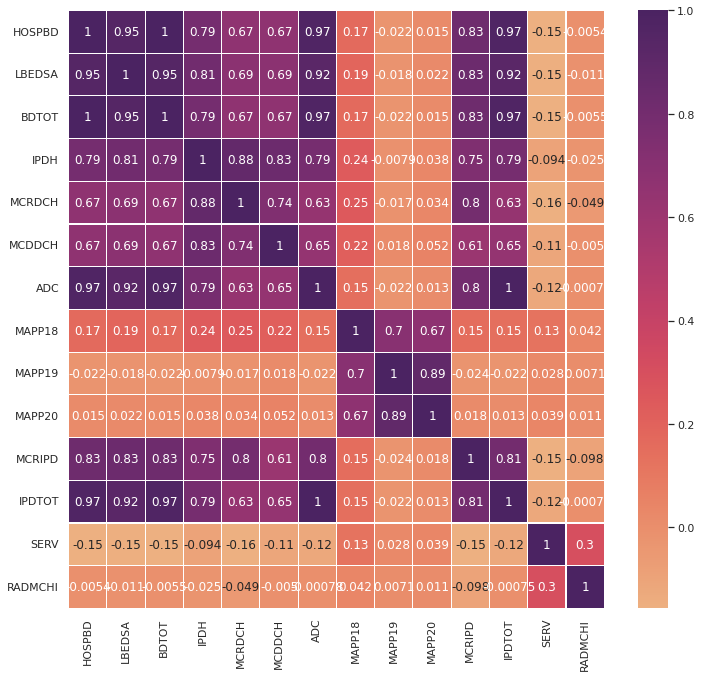

In [ ]:
test = data1[['HOSPBD','LBEDSA','BDTOT','IPDH','MCRDCH','MCDDCH','ADC','MAPP18','MAPP19','MAPP20','MCRIPD','IPDTOT','CNTRL','SERV','RADMCHI']]
corr_matrix = test.corr()
#Dropped NETWRK and MHSMEMB because they only contain null values
sns.set_theme(style="dark")
plt.figure(figsize=(12, 11))
sns.heatmap(data = corr_matrix, cmap='flare', annot=True, linewidths=0.1)
corr_matrix[corr_matrix < 0.1] = 0



#Predicting Total Admissions in the Hospitals in U.S for year (2019) with training data from year 2005 - 2018





> Taking subset of the data for performing predictive modelling





> Subset of Training data (2005 - 2018)




In [ ]:
# dt = data1[['YEAR','SUROPTOT','HOSPBD','ADMTOT','FTMDTF','PTMDTF','IPDTOT','VTOT']]
# dt['STAFF'] = dt['FTMDTF']+dt['PTMDTF']
# dt.drop(['FTMDTF','PTMDTF'], axis=1)



> Shuffling the training data



In [ ]:
# dt_shuffle = dt.sample(frac=1)
# x_train = dt_shuffle.drop('ADMTOT', axis=1)
# y_train = dt_shuffle['ADMTOT']



> Subset of Testing data(2019)



In [ ]:
# dt2 = data2[['YEAR','SUROPTOT','HOSPBD','ADMTOT','FTMDTF','PTMDTF','IPDTOT','VTOT']]
# dt2['STAFF'] = dt2['FTMDTF']+dt2['PTMDTF']
# dt2.drop(['FTMDTF','PTMDTF'], axis=1)



> Shuffling Testing data



In [ ]:
# dt_test = dt2.sample(frac=1)
# x_test = dt_test.drop('ADMTOT', axis=1)
# y_test = dt_test['ADMTOT']



> Testing accuracy scores for various regression algorithms given below:
* Linear Regression
* Ridge Regression
* Lasso Regression
* Elastic Net Regularization
* Extra Tree Regression
* Gradient Boosting Regression
* Decision Tree Regression
* K-Nearest Neighbors Regression







In [ ]:
      #   # Regression Models in use
      #   L = LinearRegression()
      #   R=Ridge()
      #   Lass=Lasso()
      #   E=ElasticNet()
      #   ETR=ExtraTreeRegressor()
      #   GBR=GradientBoostingRegressor()
      #   dt=DecisionTreeRegressor()
      #   kn=KNeighborsRegressor()


      #   algos=[L,R,Lass,E,ETR,GBR,dt,kn]
      #   algo_names=['Linear','Ridge','Lasso','ElasticNet','Extra Tree','Gradient Boosting','DecisionTree','KNeighbors']

      #   # Empty list for storing accuracy metric scores
      #   r2Score = []
      #   rmse = []
      #   mae = []


      #   result=pd.DataFrame(columns=['R2_score','RMSE','MAE'],index=algo_names)

      #  # Running algorithms and calculating accuracy metric scores
      #   for algo in algos:
      #       p=algo.fit(x_train,y_train).predict(x_test)
      #       r2Score.append(r2_score(y_test,p))
      #       rmse.append(mean_squared_error(y_test,p)**.5)
      #       mae.append(mean_absolute_error(y_test,p))


      #   result['R2_score']=r2Score
      #   result.RMSE=rmse
      #   result.MAE=mae

      #   # Sort result table by r2_score value and return it
      #   result.sort_values('R2_score',ascending=False)

# Predicting Total expenses considering various hospital services using Deep Learning (dataset - 2020)




In [ ]:
# df = pd.read_csv("aha_2020.csv", header=0, index_col=0)
# display(df.head())
# df.shape

In [ ]:
# keep_cols = ['CBSATYPE','NETWRK','HOSPBD','MHSMEMB','JNTPH','BDTOT','SERV','CNTRL', 'FTTOT', 'EXPTOT']
# for col in df.loc[0:1200,:]:
#     if(col.endswith('HOS')) and df[col].dtype == np.float64:
#         keep_cols.append(col)
# df = df[keep_cols]
# df.loc[df.CBSATYPE == "Metro","CBSATYPE"] = 1
# df.loc[df.CBSATYPE == "Rural","CBSATYPE"] = 2
# df.loc[df.CBSATYPE == "Micro","CBSATYPE"] = 3
# df = df.fillna(0)
# df.head()

In [ ]:
# df.EXPTOT.describe()

In [ ]:
# x = df.drop('EXPTOT', axis=1)
# y = df['EXPTOT']

In [ ]:
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
# x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.30, random_state=777)

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Activation
# from tensorflow.keras.optimizers import Adam

In [ ]:
# model = Sequential()
# model.add(Dense(81, activation='relu'))
# model.add(Dense(67, activation='relu'))
# model.add(Dense(40, activation='relu'))
# model.add(Dense(27, activation='relu'))
# model.add(Dense(19, activation='relu'))
# model.add(Dense(5, activation='relu'))
# model.add(Dense(3, activation='relu'))
# model.add(Dense(1))
# model.compile(optimizer='Adam', loss='mse')

In [ ]:
# model.fit(x=x_train, y=y_train, validation_data=(x_test,y_test), batch_size=8, epochs=32, verbose=0)

In [ ]:
# model.summary()

In [ ]:
# import matplotlib.pyplot as plt
# %matplotlib inline
# import seaborn as sns

In [ ]:
# loss_df = pd.DataFrame(model.history.history)
# loss_df.plot(figsize=(12,8))

In [ ]:
# y_pred = model.predict(x_test)
# from sklearn import metrics
# print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
# print('MSE:', metrics.mean_squared_error(y_test, y_pred))
# print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
# print('R2:', metrics.r2_score(y_test, y_pred))

In [ ]:
# fig=plt.figure(figsize=(10,5))
# plt.scatter(y_test, y_pred)
# plt.plot(y_test, y_test,'r')


In [ ]:
# model.predict(x_test)

In [ ]:
# dt3 = data1[['FTMDTF','CBSATYPE']]

In [ ]:
# dt3.loc[dt3['CBSATYPE']=='Metro']['FTMDTF'].mean()

In [ ]:
# dt3.loc[dt3['CBSATYPE']=='Division']['FTMDTF'].mean()

In [ ]:
# dt3.loc[dt3['CBSATYPE']=='Micro']['FTMDTF'].mean()

In [ ]:
# dt3.loc[dt3['CBSATYPE']=='Rural']['FTMDTF'].mean()

# Predict if a hospital is understaffed

In [ ]:
df = pd.read_csv("aha_2020.csv", header=0, index_col=0, low_memory=False)
df.head()

,ID,MNAME,YEAR,REG,STCD,HOSPN,DTBEG,DBEGM,DBEGD,DTEND,...,COVIDU,BAIMV,EAIMV,BPIMV,EPIMV,EDBDCHG,VIDVZ,AUVZ,PRPM,VPSRV
1,6030010,Kwajalein Hospital,2020,0,3,10.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6040001,Wilma N. Vazquez Medical Center,2020,0,4,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6040002,Hospital San Francisco,2020,0,4,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6040004,HIMA San Pablo Caguas,2020,0,4,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6040005,Hospital Buen Samaritano,2020,0,4,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



* 1 = Understaffed
* 0 = Not Understaffed

In [ ]:
data3 = df.copy()
display(data3.head())
data3['CBSATYPE'].value_counts()

,ID,MNAME,YEAR,REG,STCD,HOSPN,DTBEG,DBEGM,DBEGD,DTEND,...,COVIDU,BAIMV,EAIMV,BPIMV,EPIMV,EDBDCHG,VIDVZ,AUVZ,PRPM,VPSRV
1,6030010,Kwajalein Hospital,2020,0,3,10.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6040001,Wilma N. Vazquez Medical Center,2020,0,4,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6040002,Hospital San Francisco,2020,0,4,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6040004,HIMA San Pablo Caguas,2020,0,4,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6040005,Hospital Buen Samaritano,2020,0,4,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Metro    4219
Rural    1093
Micro     853
Name: CBSATYPE, dtype: int64

In [ ]:
data3['TOTAL_STAFF'] = data3.FTTOTH + data3.PTTOTH
data3['UNDERSTAFFED'] = np.NaN

## Averages grouped by CBSATYPE
# Average inpatient days
ipdavg = data3.groupby(['CBSATYPE'])['IPDTOT'].mean()
# Average facility expenses (w/o debt)
exptotavg = data3.groupby(['CBSATYPE'])['EXPTOT'].mean()
# Average number of employees
staffavg = data3.groupby(['CBSATYPE'])['TOTAL_STAFF'].mean()
# Average payroll expenses
paytotavg = data3.groupby(['CBSATYPE'])['PAYTOT'].mean()
# Average MCRIPD medicare days
medicareavg = data3.groupby(['CBSATYPE'])['MCRIPD'].mean()
# Average MCDIPD medicaid days
medicaidavg = data3.groupby(['CBSATYPE'])['MCDIPD'].mean()

weights = np.array([0.20, 0.15, 0.10, 0.40, 0.075, 0.075])
staffingscore = pd.Series().reindex_like(ipdavg)

for cbsa in ['Metro','Micro','Rural']:
  averages = [ipdavg[cbsa], exptotavg[cbsa], staffavg[cbsa], paytotavg[cbsa], medicareavg[cbsa], medicaidavg[cbsa]]
  staffingscore[cbsa] = np.average(averages, weights=weights)
  vals = np.array([data3.IPDTOT, data3.EXPTOT, data3.TOTAL_STAFF, data3.PAYTOT, data3.MCRIPD, data3.MCDIPD])
  data3.loc[(data3.CBSATYPE == cbsa) & (np.average(vals,weights=weights, axis=0) < staffingscore[cbsa]), 'UNDERSTAFFED'] = 1

round(average( df['salary_p_year'], weights = df['employees_number']),2)

data3.UNDERSTAFFED = data3.UNDERSTAFFED.fillna(0)
print(data3.UNDERSTAFFED.value_counts())
data3.head()



1.0    4330
0.0    1835
Name: UNDERSTAFFED, dtype: int64


,ID,MNAME,YEAR,REG,STCD,HOSPN,DTBEG,DBEGM,DBEGD,DTEND,...,EAIMV,BPIMV,EPIMV,EDBDCHG,VIDVZ,AUVZ,PRPM,VPSRV,TOTAL_STAFF,UNDERSTAFFED
1,6030010,Kwajalein Hospital,2020,0,3,10.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,585,0.0
2,6040001,Wilma N. Vazquez Medical Center,2020,0,4,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,668,1.0
3,6040002,Hospital San Francisco,2020,0,4,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,538,1.0
4,6040004,HIMA San Pablo Caguas,2020,0,4,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1991,1.0
5,6040005,Hospital Buen Samaritano,2020,0,4,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,855,1.0


In [ ]:
staffingscore.head()

CBSATYPE
Metro    7.856541e+07
Micro    2.780665e+07
Rural    1.020696e+07
dtype: float64

In [ ]:
keep_cols = ['CBSATYPE', 'IPDTOT','EXPTOT','PAYTOT','MCRIPD','MCDIPD', 'TOTAL_STAFF','UNDERSTAFFED']

locations = data3.loc[:,['LAT','LONG','UNDERSTAFFED']]
df = data3.loc[:,keep_cols]
df.loc[df.CBSATYPE == "Metro","CBSATYPE"] = 1
df.loc[df.CBSATYPE == "Rural","CBSATYPE"] = 2
df.loc[df.CBSATYPE == "Micro","CBSATYPE"] = 3
df = df.fillna(0)

df.head()

,CBSATYPE,IPDTOT,EXPTOT,PAYTOT,MCRIPD,MCDIPD,TOTAL_STAFF,UNDERSTAFFED
1,2,1054,72979072.0,30312337.0,0,0,585,0.0
2,1,26904,43015790.0,15493138.0,14415,5392,668,1.0
3,1,28250,52970595.0,19078593.0,15136,5661,538,1.0
4,1,102881,178848389.0,61335120.0,48070,22510,1991,1.0
5,1,27696,31130600.0,11651253.0,13781,6537,855,1.0


In [ ]:
df.groupby(['CBSATYPE'])['UNDERSTAFFED'].value_counts()

CBSATYPE  UNDERSTAFFED
1         1.0             2998
          0.0             1221
2         1.0              752
          0.0              341
3         1.0              580
          0.0              273
Name: UNDERSTAFFED, dtype: int64

In [ ]:
X = df.drop('UNDERSTAFFED', axis = 1)
y = df['UNDERSTAFFED']

In [ ]:
g=GaussianNB()
b=BernoulliNB()
k=KNeighborsClassifier()
svc=SVC(gamma ='auto', probability = True)
d=DecisionTreeClassifier()
log=LogisticRegression()
gbc=GradientBoostingClassifier()
mn=MultinomialNB()
r=RandomForestClassifier()
ab=AdaBoostClassifier()



algorithms = [g,k,svc]
names=['GaussianNB','K Nearest','SVM','VotingClassifier (Hard)','VotingClassifier (Soft)']

estimator = []
for (name, algo) in zip(names, algorithms):
  estimator.append((name,algo))

# Voting Classifier with hard voting
vot_hard = VotingClassifier(estimators = estimator, voting ='hard')

# Voting Classifier with soft voting
vot_soft = VotingClassifier(estimators = estimator, voting ='soft')

algorithms.append(vot_hard)
algorithms.append(vot_soft)


In [ ]:
def algo_test(X,y,algorithms=algorithms, names=names):

    for i in range(len(algorithms)):
        algorithms[i]=algorithms[i].fit(X_train,y_train)
    accuracy=[]
    precision=[]
    recall=[]
    f1=[]
    for i in range(len(algorithms)):
        accuracy.append(accuracy_score(y,algorithms[i].predict(X)))
        precision.append(precision_score(y,algorithms[i].predict(X),average='macro'))
        recall.append(recall_score(y,algorithms[i].predict(X),average='macro'))
        f1.append(f1_score(y,algorithms[i].predict(X),average='macro'))
    metrics = pd.DataFrame(columns=["Accuracy","Precision","Recall","F1"],index=names)
    metrics['Accuracy']=accuracy
    metrics['Precision']=precision
    metrics['Recall']=recall
    metrics['F1']=f1
    return metrics.sort_values('F1', ascending=False)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30, random_state=42)

In [ ]:
print(algo_test(X_test,y_test))

                         Accuracy  Precision    Recall        F1
VotingClassifier (Soft)  0.907568   0.938564  0.855011  0.883200
VotingClassifier (Hard)  0.906486   0.938865  0.852847  0.881538
K Nearest                0.892973   0.902596  0.847534  0.868052
GaussianNB               0.890270   0.899296  0.844183  0.864641
SVM                      0.683784   0.675239  0.501311  0.409374


In [ ]:
# data_test['TOTAL_STAFF'] = data_test['FTTOTH']+data_test['PTTOTH']

In [ ]:
# data_test.loc[((data_test['CBSATYPE'] == 'Metro') &  (data_test['TOTAL_STAFF'] < -923.30962)), 'BEFORE'] = 0
# data_test.loc[((data_test['CBSATYPE'] == 'Metro') &  (data_test['TOTAL_STAFF'] > 3878.72464)), 'BEFORE'] = 1
# data_test.loc[((data_test['CBSATYPE'] == 'Rural') &  (data_test['TOTAL_STAFF'] < 26.995898)), 'BEFORE']  = 0
# data_test.loc[((data_test['CBSATYPE'] == 'Rural') &  (data_test['TOTAL_STAFF'] > 488.658264)), 'BEFORE'] = 1
# data_test.loc[((data_test['CBSATYPE'] == 'Micro') &  (data_test['TOTAL_STAFF'] < -41.341579)), 'BEFORE'] = 0
# data_test.loc[((data_test['CBSATYPE'] == 'Micro') &  (data_test['TOTAL_STAFF'] > 1261.00629)), 'BEFORE'] = 1

In [ ]:
# data3.info()

In [ ]:
# data3.loc[((data3['CBSATYPE'] == 'Metro') &  (data3['TOTAL_STAFF'] < -923.30962)), 'STAFF_CATEGORY'] = 0

In [ ]:
# data3.loc[((data3['CBSATYPE'] == 'Metro') &  (data3['TOTAL_STAFF'] > 3878.72464)), 'STAFF_CATEGORY'] = 1

In [ ]:
# data3.loc[((data3['CBSATYPE'] == 'Rural') &  (data3['TOTAL_STAFF'] < 26.995898)), 'STAFF_CATEGORY'] = 0

In [ ]:
# data3.loc[((data3['CBSATYPE'] == 'Rural') &  (data3['TOTAL_STAFF'] > 488.658264	)), 'STAFF_CATEGORY'] = 1

In [ ]:
# data3.loc[((data3['CBSATYPE'] == 'Micro') &  (data3['TOTAL_STAFF'] < -41.341579)), 'STAFF_CATEGORY'] = 0

In [ ]:
# data3.loc[((data3['CBSATYPE'] == 'Micro') &  (data3['TOTAL_STAFF'] > 1261.00629	)), 'STAFF_CATEGORY'] = 1

In [ ]:
# keep_cols = ['CBSATYPE','NETWRK','HOSPBD','MHSMEMB','JNTPH','BDTOT','SERV','CNTRL', 'FTTOT', 'EXPTOT','STAFF_CATEGORY']

# df = data3[keep_cols]
# df.loc[df.CBSATYPE == "Metro","CBSATYPE"] = 1
# df.loc[df.CBSATYPE == "Rural","CBSATYPE"] = 2
# df.loc[df.CBSATYPE == "Micro","CBSATYPE"] = 3
# df = df.fillna(0)
# df.head()


In [ ]:
# keep_cols_test = ['CBSATYPE','NETWRK','HOSPBD','MHSMEMB','JNTPH','BDTOT','SERV','CNTRL', 'FTTOT', 'EXPTOT','BEFORE']
# data_test = data_test[keep_cols_test]
# data_test.loc[data_test.CBSATYPE == "Metro","CBSATYPE"] = 1
# data_test.loc[data_test.CBSATYPE == "Rural","CBSATYPE"] = 2
# data_test.loc[data_test.CBSATYPE == "Micro","CBSATYPE"] = 3
# data_test = data_test.fillna(0)
# data_test.head()


In [ ]:
# X = df.drop('STAFF_CATEGORY', axis = 1)
# y = df['STAFF_CATEGORY']
# X1 = data_test

In [ ]:
# x_train, y_train = X, y
# x_test = data_test.drop('BEFORE', axis = 1)
# y_test = data_test['BEFORE']

In [ ]:
    # g=GaussianNB()
    # b=BernoulliNB()
    # k=KNeighborsClassifier()
    # svc=SVC()
    # d=DecisionTreeClassifier()
    # log=LogisticRegression()
    # gbc=GradientBoostingClassifier()
    # mn=MultinomialNB()
    # r=RandomForestClassifier()
    # ab=AdaBoostClassifier()

    # #x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.2,random_state=42)

    # algorithms = [g,b,k,svc,log,gbc,mn,r,ab]
    # names=['GaussianNB','BernoulliNB','K Nearest','SVC','Logistic','GradientBoosting','MultinomialNB','RandomForest','AdaBoost']


In [ ]:
# def algo_test(X,y,algorithms=algorithms, names=names):

#     for i in range(len(algorithms)):
#         algorithms[i]=algorithms[i].fit(X,y)
#     accuracy=[]
#     precision=[]
#     recall=[]
#     f1=[]
#     for i in range(len(algorithms)):
#         accuracy.append(accuracy_score(y,algorithms[i].predict(X)))
#         precision.append(precision_score(y,algorithms[i].predict(X),average='macro'))
#         recall.append(recall_score(y,algorithms[i].predict(X),average='macro'))
#         f1.append(f1_score(y,algorithms[i].predict(X),average='macro'))
#     metrics = pd.DataFrame(columns=["Accuracy","Precision","Recall","F1"],index=names)
#     metrics['Accuracy']=accuracy
#     metrics['Precision']=precision
#     metrics['Recall']=recall
#     metrics['F1']=f1
#     return metrics.sort_values('F1', ascending=False)

In [ ]:
#from sklearn.model_selection import train_test_split
#from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
#x_train, x_test, y_train, y_test = train_test_split(X,y,test_size=0.30, random_state=42)

In [ ]:
# algo_test(x_test,y_test)

In [ ]:
# model = GradientBoostingClassifier()
# model.fit(x_train,y_train)

In [ ]:
# parameters={"loss":['deviance','exponential'],
#             "learning_rate":np.linspace(0.05,0.2,25),
#             "n_estimators":range(20, 201, 10)
#             }
# tuning_model = GridSearchCV(model, param_grid=parameters, scoring='neg_mean_squared_error',cv=5,verbose=3, n_jobs=-1)
# tuning_model.fit(x_train,y_train)

In [ ]:

# from sklearn.preprocessing import MinMaxScaler
# import numpy as np
# df = data3.loc[data3['CBSATYPE']=='Metro']['TOTAL_STAFF']
# column = 'TOTAL_STAFF'
# df_sklearn[column] = MinMaxScaler().fit_transform(np.array(df_sklearn[column]).reshape(-1,1))# view normalized data
# display(df_sklearn)



In [ ]:
# data1[['year','fstcd','mname','id','mcrnum','hospbd','ipdtot','']]

# Hospital Market Clustering

In [ ]:
!pip install pandasql

In [ ]:
import pandas as pd
from pandasql import sqldf
file_name = "aha_2019.csv"
data = pd.read_csv(file_name)
pysqldf = lambda q: sqldf(q, globals())

In [ ]:
query = """SELECT HOSPBD,
                  LAT,
                  LONG
           FROM data
           WHERE LAT IS NOT NULL
           AND   LONG IS NOT NULL;
        """
features = pysqldf(query)
df = features

In [ ]:
df.head()

,HOSPBD,LAT,LONG
0,14,7.0833,-171.1330
1,150,18.4533,-66.4069
2,133,18.3986,-66.0389
3,415,18.2381,-66.0372
4,145,18.4553,-67.1319


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
%matplotlib inline

In [ ]:
X = df[['LAT','LONG']]

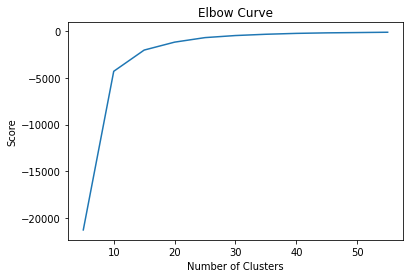

In [ ]:
K_clusters = range(5,60,5)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = df[['LAT']]
X_axis = df[['LONG']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [ ]:
X = np.array(X)
print(X[:10])

[[   7.0833 -171.133 ]
 [  18.4533  -66.4069]
 [  18.3986  -66.0389]
 [  18.2381  -66.0372]
 [  18.4553  -67.1319]
 [  18.4174  -66.0761]
 [  18.4276  -66.4843]
 [  18.0926  -67.0404]
 [  18.4102  -66.0365]
 [  18.3847  -67.089 ]]


In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=16, random_state=0).fit(X)
labels = kmeans.labels_
df['cluster'] = labels
df.head()

,HOSPBD,LAT,LONG,cluster
0,14,7.0833,-171.1330,8
1,150,18.4533,-66.4069,10
2,133,18.3986,-66.0389,10
3,415,18.2381,-66.0372,10
4,145,18.4553,-67.1319,10


In [ ]:
total = df['HOSPBD'].sum()
df0 = df.loc[df['cluster']== 0]
total0 = df0['HOSPBD'].sum()
HHI0 = (total0*100/total)**2
HHI0

223.06279944871775

In [ ]:
total = df['HOSPBD'].sum()
df1 = df.loc[df['cluster']== 1]
total1 = df1['HOSPBD'].sum()
HHI1 = (total1*100/total)**2
HHI1

101.48257931925755

In [ ]:
total = df['HOSPBD'].sum()
df2 = df.loc[df['cluster']== 2]
total2 = df2['HOSPBD'].sum()
HHI2 = (total2*100/total)**2
HHI2

8.511577971726688

In [ ]:
total = df['HOSPBD'].sum()
df3 = df.loc[df['cluster']== 3]
total3 = df3['HOSPBD'].sum()
HHI3 = (total3*100/total)**2
HHI3

124.75632072403003

In [ ]:
total = df['HOSPBD'].sum()
df4 = df.loc[df['cluster']== 4]
total4 = df4['HOSPBD'].sum()
HHI4 = (total4*100/total)**2
HHI4

272.2242294544637

In [ ]:
total = df['HOSPBD'].sum()
df5 = df.loc[df['cluster']== 5]
total5 = df5['HOSPBD'].sum()
HHI5 = (total5*100/total)**2
HHI5

48.7141665495246

In [ ]:
total = df['HOSPBD'].sum()
df6 = df.loc[df['cluster']== 6]
total6 = df6['HOSPBD'].sum()
HHI6 = (total6*100/total)**2
HHI6

15.393360708560317

In [ ]:
total = df['HOSPBD'].sum()
df7 = df.loc[df['cluster']== 7]
total7 = df7['HOSPBD'].sum()
HHI7 = (total7*100/total)**2
HHI7

8.557828149962852e-05

In [ ]:
total = df['HOSPBD'].sum()
df8 = df.loc[df['cluster']== 8]
total8 = df8['HOSPBD'].sum()
HHI8 = (total8*100/total)**2
HHI8

0.17222298224427215

In [ ]:
total = df['HOSPBD'].sum()
df9 = df.loc[df['cluster']== 9]
total9 = df9['HOSPBD'].sum()
HHI9 = (total9*100/total)**2
HHI9

8.80083113997631

In [ ]:
total = df['HOSPBD'].sum()
df10 = df.loc[df['cluster']== 10]
total10 = df10['HOSPBD'].sum()
HHI10 = (total10*100/total)**2
HHI10

1.0648184012044357

In [ ]:
total = df['HOSPBD'].sum()
df11 = df.loc[df['cluster']== 11]
total11 = df11['HOSPBD'].sum()
HHI11 = (total11*100/total)**2
HHI11

0.04181488362109777

In [ ]:
total = df['HOSPBD'].sum()
df12 = df.loc[df['cluster']== 12]
total12 = df12['HOSPBD'].sum()
HHI12 = (total12*100/total)**2
HHI12

67.77770070808901

In [ ]:
total = df['HOSPBD'].sum()
df13 = df.loc[df['cluster']== 13]
total13 = df13['HOSPBD'].sum()
HHI13 = (total13*100/total)**2
HHI13

6.742255529465713

In [ ]:
total = df['HOSPBD'].sum()
df14 = df.loc[df['cluster']== 14]
total14 = df14['HOSPBD'].sum()
HHI14 = (total14*100/total)**2
HHI14

184.36774423574136

In [ ]:
total = df['HOSPBD'].sum()
df15 = df.loc[df['cluster']== 15]
total15 = df15['HOSPBD'].sum()
HHI15 = (total15*100/total)**2
HHI15

19.953899219597503

In [ ]:
df.loc[df['cluster']==0,'BEDS_HHI'] = HHI0
df.loc[df['cluster']==1,'BEDS_HHI'] = HHI1
df.loc[df['cluster']==2,'BEDS_HHI'] = HHI2
df.loc[df['cluster']==3,'BEDS_HHI'] = HHI3
df.loc[df['cluster']==4,'BEDS_HHI'] = HHI4
df.loc[df['cluster']==5,'BEDS_HHI'] = HHI5
df.loc[df['cluster']==6,'BEDS_HHI'] = HHI6
df.loc[df['cluster']==7,'BEDS_HHI'] = HHI7
df.loc[df['cluster']==8,'BEDS_HHI'] = HHI8
df.loc[df['cluster']==9,'BEDS_HHI'] = HHI9
df.loc[df['cluster']==10,'BEDS_HHI'] = HHI10
df.loc[df['cluster']==11,'BEDS_HHI'] = HHI11
df.loc[df['cluster']==12,'BEDS_HHI'] = HHI12
df.loc[df['cluster']==13,'BEDS_HHI'] = HHI13
df.loc[df['cluster']==14,'BEDS_HHI'] = HHI14
df.loc[df['cluster']==15,'BEDS_HHI'] = HHI15

In [ ]:
df.head()

,HOSPBD,LAT,LONG,cluster,BEDS_HHI
0,14,7.0833,-171.1330,8,0.172223
1,150,18.4533,-66.4069,10,1.064818
2,133,18.3986,-66.0389,10,1.064818
3,415,18.2381,-66.0372,10,1.064818
4,145,18.4553,-67.1319,10,1.064818


In [ ]:
type(df["cluster"][0])

numpy.int32

In [ ]:
for _, row in df.iterrows():
  print(_)
  print(row)

Streaming output truncated to the last 5000 lines.
BEDS_HHI      8.511578
Name: 5445, dtype: float64
5446
HOSPBD       33.000000
LAT          41.069900
LONG       -111.981000
cluster       2.000000
BEDS_HHI      8.511578
Name: 5446, dtype: float64
5447
HOSPBD       20.000000
LAT          41.157100
LONG       -111.941000
cluster       2.000000
BEDS_HHI      8.511578
Name: 5447, dtype: float64
5448
HOSPBD       23.000000
LAT          40.303400
LONG       -111.706000
cluster       2.000000
BEDS_HHI      8.511578
Name: 5448, dtype: float64
5449
HOSPBD       59.000000
LAT          40.575900
LONG       -111.854000
cluster       2.000000
BEDS_HHI      8.511578
Name: 5449, dtype: float64
5450
HOSPBD       45.000000
LAT          40.604800
LONG       -111.855000
cluster       2.000000
BEDS_HHI      8.511578
Name: 5450, dtype: float64
5451
HOSPBD      119.000000
LAT          39.156600
LONG       -111.816000
cluster       2.000000
BEDS_HHI      8.511578
Name: 5451, dtype: float64
5452
HOSPBD      

In [ ]:
import folium
import random
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
     'lightred', 'cyan', 'darkblue', 'darkgreen', 'cadetblue',
     'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray',
     'black']
# lat = df.iloc[0]['LAT']
# lng = df.iloc[0]['LONG']
lat = 37.0902
lng = -95.7129
map = folium.Map(location=[lat, lng], zoom_start=3)
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row["LAT"], row["LONG"]],
        radius=5,
        weight=2,
        fill=True,
        fill_color=colors[int(row["cluster"])],
        color=colors[int(row["cluster"])],
        popup=str(row['BEDS_HHI'])
    ).add_to(map)
map